# Rotation Overlays

In [2]:
%pip install --upgrade -r requirements.txt
%pip install rp --upgrade

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.4/3.4 MB 13.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.9/11.9 MB 46.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.9/60.9 MB 9.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.6/11.6 MB 48.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 125.3/125.3 kB 17.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.4/78.4 kB 11.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 55.5/55.5 kB 8.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 53.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 38.6/38.6 MB 13.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.0/9.0 MB 60.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 83.0 MB/s eta 0:00:00
  Attempting uninstall: tqdm
    Found existing installation: tqdm 4.66.4
    Uninstalling tqdm-4.66.4:
      Success

Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/pip/_vendor/pkg_resources/__init__.py", line 3108, in _dep_map
    return self.__dep_map
  File "/usr/local/lib/python3.10/dist-packages/pip/_vendor/pkg_resources/__init__.py", line 2901, in __getattr__
    raise AttributeError(attr)
AttributeError: _DistInfoDistribution__dep_map

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/pip/_internal/cli/base_command.py", line 169, in exc_logging_wrapper
    status = run_func(*args)
  File "/usr/local/lib/python3.10/dist-packages/pip/_internal/cli/req_command.py", line 242, in wrapper
    return func(self, options, args)
  File "/usr/local/lib/python3.10/dist-packages/pip/_internal/commands/install.py", line 441, in run
    conflicts = self._determine_conflicts(to_install)
  File "/usr/local/lib/python3.10/dist-packages/pip/_internal/commands/install.py", line 

In [1]:
import numpy as np
import rp
import torch
import torch.nn as nn
from easydict import EasyDict
from itertools import chain
import time
import einops
from typing import Union,List,Optional
from transformers import CLIPTextModel, CLIPTokenizer, logging
from diffusers import AutoencoderKL, UNet2DConditionModel, PNDMScheduler
from diffusers import StableDiffusionPipeline
import torch.nn.functional as F


In [2]:
# Suppress partial model loading warning
logging.set_verbosity_error()

## helper functions

In [3]:
def get_uv_grid(height:int, width:int, batch_size:int=1)->torch.Tensor:
    #Returns a torch cpu tensor of shape (batch_size,2,height,width)
    #Note: batch_size can probably be removed from this function after refactoring this file. It's always 1 in all usages.
    #The second dimension is (x,y) coordinates, which go from [0 to 1) from edge to edge
    #(In other words, it will include x=y=0, but instead of x=y=1 the other corner will be x=y=.999)
    #(this is so it doesn't wrap around the texture 360 degrees)
    assert height>0 and width>0 and batch_size>0,'All dimensions must be positive integers'

    y_coords = np.linspace(0, 1, height, endpoint=False)
    x_coords = np.linspace(0, 1, width , endpoint=False)

    uv_grid = np.stack(np.meshgrid(y_coords, x_coords), -1)
    uv_grid = torch.tensor(uv_grid).unsqueeze(0).permute(0, 3, 1, 2).float().contiguous()
    uv_grid = uv_grid.repeat(batch_size,1,1,1)

    assert tuple(uv_grid.shape)==(batch_size,2,height,width)

    return uv_grid



In [4]:
class LearnableImage(nn.Module):
    def __init__(self,
                 height      :int,
                 width       :int,
                 num_channels:int):

        #This is an abstract class, and is meant to be subclassed before use
        #Upon calling forward(), retuns a tensor of shape (num_channels, height, width)

        super().__init__()

        self.height      =height
        self.width       =width
        self.num_channels=num_channels

    def as_numpy_image(self):
        image=self()
        image=rp.as_numpy_array(image)
        image=image.transpose(1,2,0)
        return image


In [5]:
# stable diffusion class




_stable_diffusion_singleton = None #This singleton gets set the first time a StableDiffusion is constructed. Usually you'll only ever make one.

def _get_stable_diffusion_singleton():
    if _stable_diffusion_singleton is None:
        assert False, 'Please create a stable_diffusion.StableDiffusion instance before creating a label'
    return _stable_diffusion_singleton


class StableDiffusion(nn.Module):
    def __init__(self, device='cuda', checkpoint_path="CompVis/stable-diffusion-v1-4", pipe=None):

        global _stable_diffusion_singleton
        if _stable_diffusion_singleton is not None:
            rp.fansi_print('WARNING! StableDiffusion was instantiated twice!','yellow','bold')
        #Set the singleton. Other classes such as Label need this.
        _stable_diffusion_singleton=self

        super().__init__()

        self.device = torch.device(device)
        self.num_train_timesteps = 1000

        # Timestep ~ U(0.02, 0.98) to avoid very high/low noise levels
        self.min_step = int(self.num_train_timesteps * 0.02) # aka 20
        self.max_step = int(self.num_train_timesteps * 0.98) # aka 980

        print('[INFO] sd.py: loading stable diffusion...please make sure you have run `huggingface-cli login`.')

        # Unlike the original code, I'll load these from the pipeline. This lets us use dreambooth models.
        if pipe is None:
            pipe = StableDiffusionPipeline.from_pretrained(
                checkpoint_path,
                torch_dtype=torch.float,
                requires_safety_checker=False,
                safety_checker=None,
            )

        pipe.scheduler = PNDMScheduler(beta_start=0.00085, beta_end=0.012, beta_schedule="scaled_linear", num_train_timesteps=self.num_train_timesteps) #Error from scheduling_lms_discrete.py

        self.pipe         = pipe
        self.vae          = pipe.vae         .to(self.device) ; assert isinstance(self.vae          , AutoencoderKL       ),type(self.vae          )
        self.tokenizer    = pipe.tokenizer                    ; assert isinstance(self.tokenizer    , CLIPTokenizer       ),type(self.tokenizer    )
        self.text_encoder = pipe.text_encoder.to(self.device) ; assert isinstance(self.text_encoder , CLIPTextModel       ),type(self.text_encoder )
        self.unet         = pipe.unet        .to(self.device) ; assert isinstance(self.unet         , UNet2DConditionModel),type(self.unet         )
        self.scheduler    = pipe.scheduler                    ; #assert isinstance(self.scheduler    , PNDMScheduler       ),type(self.scheduler    )

        self.uncond_text=''

        self.checkpoint_path=checkpoint_path

        self.alphas = self.scheduler.alphas_cumprod.to(self.device) # for convenience

        print(f'[INFO] sd.py: loaded stable diffusion!')

    def get_text_embeddings(self, prompts: Union[str, List[str]])->torch.Tensor:

        if isinstance(prompts,str):
            prompts=[prompts]

        # Tokenize text and get embeddings
        text_input = self.tokenizer(prompts, padding='max_length', max_length=self.tokenizer.model_max_length, truncation=True, return_tensors='pt').input_ids

        with torch.no_grad():
            text_embeddings = self.text_encoder(text_input.to(self.device))[0]

        # Do the same for unconditional embeddings
        uncond_input = self.tokenizer([self.uncond_text] * len(prompts), padding='max_length', max_length=self.tokenizer.model_max_length, return_tensors='pt').input_ids

        with torch.no_grad():
            uncond_embeddings = self.text_encoder(uncond_input.to(self.device))[0]

        assert len(uncond_embeddings)==len(text_embeddings)==len(prompts)==len(text_input)==len(uncond_input)

        output_embeddings = torch.cat([uncond_embeddings, text_embeddings])

        assert (uncond_embeddings==torch.stack([uncond_embeddings[0]]*len(uncond_embeddings))).all()
        assert (uncond_embeddings==uncond_embeddings[0][None]).all()

        assert output_embeddings.shape == (len(prompts)*2, 77, 768)

        return output_embeddings

    def add_noise(self, original_samples, noise, timesteps):
        #This is identical to scheduler.add_noise, assuming the scheduler is DDIM, DDPM or PNDM
        #It was copy-pasted
        timesteps = timesteps.cpu()
        sqrt_alpha_prod = self.scheduler.alphas_cumprod[timesteps] ** 0.5
        # sqrt_alpha_prod = self.scheduler.match_shape(sqrt_alpha_prod, original_samples)
        sqrt_one_minus_alpha_prod = (1 - self.scheduler.alphas_cumprod[timesteps].to(self.device)) ** 0.5
        # sqrt_one_minus_alpha_prod = self.scheduler.match_shape(sqrt_one_minus_alpha_prod, original_samples)

        noisy_latents = sqrt_alpha_prod.to(self.device) * original_samples.to(self.device) + sqrt_one_minus_alpha_prod * noise
        return noisy_latents

    def remove_noise(self, noisy_latents, noise, timesteps):
        #TODO: Add shape assertions
        #This is the inverse of add_noise
        timesteps = timesteps.cpu()
        sqrt_alpha_prod = self.scheduler.alphas_cumprod[timesteps] ** 0.5
        # sqrt_alpha_prod = self.scheduler.match_shape(sqrt_alpha_prod, noisy_latents)
        sqrt_one_minus_alpha_prod = (1 - self.scheduler.alphas_cumprod[timesteps].to(self.device)) ** 0.5
        # sqrt_one_minus_alpha_prod = self.scheduler.match_shape(sqrt_one_minus_alpha_prod, noisy_latents)

        original_samples = (noisy_latents - sqrt_one_minus_alpha_prod * noise) / sqrt_alpha_prod.to(self.device)
        return original_samples

    def predict_noise(self, noisy_latents, text_embeddings, timestep):
        return self.unet(noisy_latents, timestep, encoder_hidden_states=text_embeddings)['sample']

    def train_step(self,
                   text_embeddings:torch.Tensor,
                   pred_rgb:torch.Tensor,
                   guidance_scale:float=100,
                   t:Optional[int]=None,
                   noise_coef=1,
                   latent_coef=0,
                   image_coef=0,
                  ):

        # This method is responsible for generating the dream-loss gradients.

        # interp to 512x512 to be fed into vae
        pred_rgb_512 = F.interpolate(pred_rgb, (512, 512), mode='bilinear', align_corners=False)

        if t is None:
            t = torch.randint(self.min_step, self.max_step + 1, [1], dtype=torch.long, device=self.device)

        assert 0<=t<self.num_train_timesteps, 'invalid timestep t=%i'%t

        # encode image into latents with vae, requires grad!
        latents = self.encode_imgs(pred_rgb_512).to(self.device)


        # predict the noise residual with unet, NO grad!
        with torch.no_grad():
            # add noise
            noise = torch.randn_like(latents).to(self.device)
            #This is the only place we use the scheduler...the add_noise function. What's more...it's totally generic! The scheduler doesn't impact the implementation of train_step...
            latents_noisy = self.add_noise(latents, noise, t) #The add_noise function is identical for PNDM, DDIM, and DDPM schedulers in the diffusers library
            #TODO: Expand this add_noise function, and put it in this class. That way we don't need the scheduler...and we can also add an inverse function, which is what I need for previews...that subtracts noise...
            #Also, create a dream-loss-based image gen example notebook...

            # pred noise
            latent_model_input = torch.cat([latents_noisy] * 2)
            noise_pred = self.predict_noise(latent_model_input, text_embeddings, t)

            latent_pred = self.remove_noise(latents_noisy, noise_pred, t)
            output = latent_pred

            if image_coef:
                image_pred = self.decode_latents(latent_pred)


        #TODO: Different guidance scales for each type...if mixing them is useful...

        w = (1 - self.alphas[t])

        # perform noise guidance (high scale from paper!)
        noise_pred_uncond, noise_pred_text = noise_pred.chunk(2)
        noise_pred = noise_pred_uncond + guidance_scale * (noise_pred_text - noise_pred_uncond)
        noise_delta=noise_pred - noise
        total_delta=noise_delta * noise_coef

        # Ryan's Latent Guidance
        latent_pred_uncond, latent_pred_text = latent_pred.chunk(2)
        latent_pred = latent_pred_uncond + guidance_scale * (latent_pred_text - latent_pred_uncond)
        latent_delta=latent_pred - latents
        total_delta=total_delta + latent_delta * latent_coef

        output=torch.stack([*output, *latent_pred])

        if image_coef:
            # Ryan's Image Guidance
            image_pred_uncond, image_pred_text = image_pred.chunk(2)
            image_pred = image_pred_uncond + guidance_scale * (image_pred_text - image_pred_uncond)
            image_delta=image_pred - pred_rgb_512
            pred_rgb_512.backward(gradient = w * image_delta * image_coef, retain_graph=True)


        # w(t), sigma_t^2
        grad = w * total_delta

        # manually backward, since we omitted an item in grad and cannot simply autodiff
        latents.backward(gradient=grad, retain_graph=True)

        return output

    def produce_latents(self, text_embeddings:torch.Tensor, height:int=512, width:int=512, num_inference_steps=50, guidance_scale=7.5, latents=None)->torch.Tensor:
        assert len(text_embeddings.shape)==3 and text_embeddings.shape[-2:]==(77,768)
        assert not len(text_embeddings)%2
        num_prompts = len(text_embeddings)//2

        if latents is None:
            latents = torch.randn((num_prompts, self.unet.in_channels, height // 8, width // 8), device=self.device)

        assert 0 <= num_inference_steps <= 1000, 'Stable diffusion appears to be trained with 1000 timesteps'

        self.scheduler.set_timesteps(num_inference_steps)

        with torch.autocast('cuda'):
            for i, t in enumerate(self.scheduler.timesteps):
                assert int(t) == t and 0 <= t <= 999, 'Suprisingly to me...the timesteps were encoded as integers lol (np.int64)'
                assert int(i) == i and 0 <= i <= 999, 'And because there are 1000 of them, the index is also bounded'
                t=int(t) # This akes some schedulers happy; it's the same value anyway.

                # Expand the latents if we are doing classifier-free guidance to avoid doing two forward passes.
                latent_model_input = torch.cat([latents] * 2) #The first half is the blank prompts (repeated); the second half is

                # predict the noise r['sample']
                with torch.no_grad():
                    noise_pred = self.unet(latent_model_input, t, encoder_hidden_states=text_embeddings)['sample']
                    assert len(latent_model_input)==len(text_embeddings)==len(noise_pred)

                # perform guidance
                assert noise_pred.shape == (2*num_prompts, 4, 64, 64)
                noise_pred_uncond, noise_pred_text = noise_pred.chunk(2)
                noise_pred = noise_pred_uncond + guidance_scale * (noise_pred_text - noise_pred_uncond)
                assert noise_pred.shape == (1*num_prompts, 4, 64, 64)

                # compute the previous noisy sample x_t -> x_t-1
                latents = self.scheduler.step(noise_pred, t, latents)['prev_sample'] #It's a dict with nothing but 'prev_sample' in it
                assert latents.shape==noise_pred.shape == (num_prompts, 4, 64, 64)

        return latents

    def decode_latents(self, latents:torch.Tensor)->torch.Tensor:

        assert len(latents.shape) == 4 and latents.shape[1] == 4  # [B, 4, H, W]

        latents = 1 / 0.18215 * latents

        imgs = self.vae.decode(latents)
        if hasattr(imgs,'sample'):
            #For newer versions of the Diffusers library
            imgs=imgs.sample

        imgs = (imgs / 2 + 0.5).clamp(0, 1)

        assert len(imgs.shape) == 4 and imgs.shape[1] == 3  # [B, 3, H, W]

        return imgs

    def encode_imgs(self, imgs:torch.Tensor)->torch.Tensor:

        assert len(imgs.shape)==4 and imgs.shape[1]==3 #[B, 3, H, W]

        imgs = 2 * imgs - 1
        posterior = self.vae.encode(imgs)
        latents = posterior.latent_dist.sample() * 0.18215

        assert len(latents.shape)==4 and latents.shape[1]==4 #[B, 4, H, W]

        return latents

    def decode_latent(self, latent: torch.Tensor) -> torch.Tensor:

        assert len(latent.shape) == 3 and latent.shape[0] == 4  # [4, H, W]

        img = self.decode_latents(latent[None])[0]

        assert len(img.shape) == 3 and img.shape[0] == 3  # [3, H, W]

        return img

    def encode_img(self, img: torch.Tensor) -> torch.Tensor:

        assert len(img.shape) == 3 and img.shape[0] == 3  # [3, H, W]

        latent = self.encode_imgs(img[None])[0]

        assert len(latent.shape) == 3 and latent.shape[0] == 4  # [4, H, W]

        return latent

    def embeddings_to_imgs(self, text_embeddings:torch.Tensor,
                     height:int=512,
                     width:int=512,
                     num_inference_steps:int=50,
                     guidance_scale:float=7.5,
                     latents:Optional[torch.Tensor]=None)->torch.Tensor:

        assert len(text_embeddings.shape)==3 and text_embeddings.shape[1:]==(77,768)
        assert not len(text_embeddings)%2
        num_prompts=len(text_embeddings)//2

        # text embeddings -> img latents
        latents = self.produce_latents(text_embeddings,
                                       height=height,
                                       width=width,
                                       latents=latents,
                                       num_inference_steps=num_inference_steps,
                                       guidance_scale=guidance_scale)
        assert latents.shape==(num_prompts, 4, 64, 64)

        # img latents -> imgs
        with torch.no_grad():
            imgs = self.decode_latents(latents)
        assert imgs.shape==(num_prompts,3,512,512)

        # torch imgs -> numpy imgs
        imgs = rp.as_numpy_images(imgs)
        assert imgs.shape==(num_prompts,512,512,3)

        return imgs

    def prompts_to_imgs(self, prompts: List[str],
                        height:int=512,
                        width:int=512,
                        num_inference_steps:int=50,
                        guidance_scale:float=7.5,
                        latents:Optional[torch.Tensor]=None)->torch.Tensor:

        if isinstance(prompts, str):
            prompts = [prompts]

        # prompts -> text embeddings
        text_embeddings = self.get_text_embeddings(prompts)
        assert text_embeddings.shape==( len(prompts)*2, 77, 768 )

        return self.embeddings_to_imgs(text_embeddings, height, width, num_inference_steps, guidance_scale, latents)

    def prompt_to_img(self, prompt:str, *args, **kwargs)->torch.Tensor:
        return self.prompts_to_imgs([prompt],*args,**kwargs)[0]


In [6]:
class BaseLabel:
    def __init__(self, name:str, embedding:torch.Tensor, device=None):
        #Later on we might have more sophisticated embeddings, such as averaging multiple prompts
        #We also might have associated colors for visualization, or relations between labels

        if device is None:
            device=_get_stable_diffusion_singleton().device

        self.name=name
        self.embedding=embedding.to(device)

    def get_sample_image(self):
        s = _get_stable_diffusion_singleton()
        with torch.no_grad():
            output=s.embeddings_to_imgs(self.embedding)[0]
        assert rp.is_image(output)
        return output

    def __repr__(self):
        return '%s(name=%s)'%(type(self).__name__,self.name)


In [7]:

class NegativeLabel(BaseLabel):
    def __init__(self, name:str, negative_prompt='', device=None):
        s = _get_stable_diffusion_singleton()

        if '---' in name:
            #You can use '---' in a prompt to specify the negative part
            name,additional_negative_prompt=name.split('---',maxsplit=1)
            negative_prompt+=' '+additional_negative_prompt

        self.negative_prompt=negative_prompt
        old_uncond_text=s.uncond_text
        try:
            s.uncond_text=negative_prompt
            embedding = s.get_text_embeddings(name)
            super().__init__(name, embedding, device=device)
        finally:
            s.uncond_text=old_uncond_text


In [8]:
class GaussianFourierFeatureTransform(nn.Module):
    """
    Original authors: https://github.com/ndahlquist/pytorch-fourier-feature-networks

    An implementation of Gaussian Fourier feature mapping.

    "Fourier Features Let Networks Learn High Frequency Functions in Low Dimensional Domains":
       https://arxiv.org/abs/2006.10739
       https://people.eecs.berkeley.edu/~bmild/fourfeat/index.html

    Given an input of size [batches, num_input_channels, width, height],
     returns a tensor of size [batches, num_features*2, width, height].
    """

    def __init__(self, num_channels, num_features=256, scale=10):
        #It generates fourier components of Arandom frequencies, not all of them.
        #The frequencies are determined by a random normal distribution, multiplied by "scale"
        #So, when "scale" is higher, the fourier features will have higher frequencies
        #In learnable_image_tutorial.ipynb, this translates to higher fidelity images.
        #In other words, 'scale' loosely refers to the X,Y scale of the images
        #With a high scale, you can learn detailed images with simple MLP's
        #If it's too high though, it won't really learn anything but high frequency noise

        super().__init__()

        self.num_channels = num_channels
        self.num_features = num_features

        #freqs are n-dimensional spatial frequencies, where n=num_channels
        self.freqs = nn.Parameter(torch.randn(num_channels, num_features) * scale, requires_grad=False)

    def forward(self, x):
        assert x.dim() == 4, 'Expected 4D input (got {}D input)'.format(x.dim())

        batch_size, num_channels, height, width = x.shape

        assert num_channels == self.num_channels,\
            "Expected input to have {} channels (got {} channels)".format(self.num_channels, num_channels)

        # Make shape compatible for matmul with freqs.
        # From [B, C, H, W] to [(B*H*W), C].
        x = x.permute(0, 2, 3, 1).reshape(batch_size * height * width, num_channels)

        # [(B*H*W), C] x [C, F] = [(B*H*W), F]
        x = x @ self.freqs

        # From [(B*H*W), F] to [B, H, W, F]
        x = x.view(batch_size, height, width, self.num_features)
        # From [B, H, W, F] to [B, F, H, W
        x = x.permute(0, 3, 1, 2)

        x = 2 * torch.pi * x

        output = torch.cat([torch.sin(x), torch.cos(x)], dim=1)

        assert output.shape==(batch_size, 2*self.num_features, height, width)

        return output



In [9]:
class LearnableImageFourier(LearnableImage):
  def __init__(self,
                 height      :int=256 , # Height of the learnable images
                 width       :int=256 , # Width of the learnable images
                 num_channels:int=3   , # Number of channels in the images
                 hidden_dim  :int=256 , # Number of dimensions per hidden layer of the MLP
                 num_features:int=128 , # Number of fourier features per coordinate
                 scale       :int=10  , # Magnitude of the initial feature noise
                ):
        #TODO: Make resolution changeable mid-training. Right now it's saved into the state...and it cant be changed mid-training.
        #An image paramterized by a fourier features fed into an MLP
        #The possible output range of these images is between 0 and 1
        #In other words, no pixel will ever have a value <0 or >1

        super().__init__(height,width,num_channels)

        self.hidden_dim  =hidden_dim
        self.num_features=num_features
        self.scale       =scale

        # The following objects do NOT have parameters, and are not changed while optimizing this class
        self.uv_grid=nn.Parameter(get_uv_grid(height,width,batch_size=1), requires_grad=False)
        self.feature_extractor=GaussianFourierFeatureTransform(2, num_features, scale)
        self.features=nn.Parameter(self.feature_extractor(self.uv_grid), requires_grad=False) # pre-compute this if we're regressing on images

        H=hidden_dim # Number of hidden features. These 1x1 convolutions act as a per-pixel MLP
        C=num_channels  # Shorter variable names let us align the code better
        M=2*num_features
        self.model = nn.Sequential(
                nn.Conv2d(M, H, kernel_size=1), nn.ReLU(), nn.BatchNorm2d(H),
                nn.Conv2d(H, H, kernel_size=1), nn.ReLU(), nn.BatchNorm2d(H),
                nn.Conv2d(H, H, kernel_size=1), nn.ReLU(), nn.BatchNorm2d(H),
                nn.Conv2d(H, C, kernel_size=1),
                nn.Sigmoid(),
            )


  def get_features(self, condition=None):
        #TODO: Don't keep this! Condition should be CONATENATED! Not replacing features...this is just for testing...

        features = self.features

        assert features.shape == (1, 2*self.num_features, self.height, self.width), features.shape

        if condition is not None:
            #Replace the first n features with the condition, where n = len(condition)
            assert isinstance(condition, torch.Tensor)
            assert condition.device == self.features.device
            assert len(condition.shape)==1, 'Condition should be a vector'
            assert len(condition)<=2*self.num_features
            features = features.clone()
            features = einops.rearrange(features, 'B C H W -> B H W C')
            features[..., :len(condition)] = condition
            features = einops.rearrange(features, 'B H W C -> B C H W')

        assert features.shape == (1, 2*self.num_features, self.height, self.width)

        return features

  def forward(self, condition=None):
        # Return all the images we've learned

        features = self.get_features(condition)

        output = self.model(features).squeeze(0)

        assert output.shape==(self.num_channels, self.height, self.width)

        return output


## pipeline

In [10]:
prompt_w =  'detailed science - fiction character portrait of a silverback gorilla shooting a alien gun in space, intricate, wild, highly detailed, digital painting, artstation, concept art, smooth, sharp focus, illustration, art by artgerm and greg rutkowski and alphonse mucha'
prompt_x =  'mickey mouse oil on canvas, artstation trending'
prompt_y =  'Manga cover illustration of an extremely cute and adorable beautiful pikachu running through a flower field, summer vibrance, 3d render diorama by hayao miyazaki, official studio ghibli still, color graflex macro photograph, pixiv, daz studio 3d'
prompt_z =  'ultra realistic photo portrait of Emma Watson cosmic energy, colorful, painting burst, beautiful symmetrical face, nonchalant kind look, realistic round eyes, tone mapped, intricate, elegant, highly detailed, digital painting, artstation, concept art, smooth, sharp focus, illustration, dreamy magical atmosphere, art by artgerm and greg rutkowski and alphonse mucha, 4k, 8k'

In [12]:
def get_display_image():
    return rp.tiled_images(
        [
            *[rp.as_numpy_image(image()) for image in learnable_images],
            rp.as_numpy_image(bottom_image()),
            rp.as_numpy_image(top_image()),
        ],
        length=len(learnable_images),
        border_thickness=0,
    )

# New Section

In [13]:
if 's' not in dir():
    model_name="CompVis/stable-diffusion-v1-4"
    gpu='cuda:0'
    s = StableDiffusion(gpu,model_name)
device = s.device

Cannot initialize model with low cpu memory usage because `accelerate` was not found in the environment. Defaulting to `low_cpu_mem_usage=False`. It is strongly recommended to install `accelerate` for faster and less memory-intense model loading. You can do so with: 
```
pip install accelerate
```
.


[INFO] sd.py: loading stable diffusion...please make sure you have run `huggingface-cli login`.


/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:88: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


model_index.json:   0%|          | 0.00/541 [00:00<?, ?B/s]

Fetching 14 files:   0%|          | 0/14 [00:00<?, ?it/s]

tokenizer/tokenizer_config.json:   0%|          | 0.00/806 [00:00<?, ?B/s]

tokenizer/special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

(…)ature_extractor/preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

(…)kpoints/scheduler_config-checkpoint.json:   0%|          | 0.00/209 [00:00<?, ?B/s]

tokenizer/merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

scheduler/scheduler_config.json:   0%|          | 0.00/313 [00:00<?, ?B/s]

text_encoder/config.json:   0%|          | 0.00/592 [00:00<?, ?B/s]

tokenizer/vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

vae/config.json:   0%|          | 0.00/551 [00:00<?, ?B/s]

unet/config.json:   0%|          | 0.00/743 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/492M [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

[INFO] sd.py: loaded stable diffusion!


In [14]:
label_w = NegativeLabel(prompt_w,negative_prompt)
label_x = NegativeLabel(prompt_x,negative_prompt)
label_y = NegativeLabel(prompt_y,negative_prompt)
label_z = NegativeLabel(prompt_z,negative_prompt)

In [15]:
learnable_image_maker = lambda: LearnableImageFourier(height=256, width=256, hidden_dim=256, num_features=128).to(s.device); SIZE=256

bottom_image=learnable_image_maker()
top_image=learnable_image_maker()

In [16]:
brightness=3

CLEAN_MODE = True # If it's False, we augment the images by randomly simulating how good a random printer might be when making the overlays...

def simulate_overlay(bottom, top):
    if CLEAN_MODE:
        exp=1
        brightness=3
        black=0
    else:
        exp=rp.random_float(.5,1)
        brightness=rp.random_float(1,5)
        black=rp.random_float(0,.5)
        bottom=rp.blend(bottom,black,rp.random_float())
        top=rp.blend(top,black,rp.random_float())
    return (bottom**exp * top**exp * brightness).clamp(0,99).tanh()

learnable_image_w=lambda: simulate_overlay(bottom_image(), top_image().rot90(k=0,dims=[1,2]))
learnable_image_x=lambda: simulate_overlay(bottom_image(), top_image().rot90(k=1,dims=[1,2]))
learnable_image_y=lambda: simulate_overlay(bottom_image(), top_image().rot90(k=2,dims=[1,2]))
learnable_image_z=lambda: simulate_overlay(bottom_image(), top_image().rot90(k=3,dims=[1,2]))


params=chain(
    bottom_image.parameters(),
    top_image.parameters(),
)
optim=torch.optim.SGD(params,lr=1e-4)

In [17]:
nums=[0,1,2,3] # use all prompts

#The weight coefficients for each prompt. For example, if we have [0,1,2,1], then prompt_w will provide no influence and prompt_y will have 1/2 the total influence
weights=[1,1,1,1]


In [18]:
labels=[label_w,label_x,label_y,label_z]
learnable_images=[learnable_image_w,learnable_image_x,learnable_image_y,learnable_image_z]

In [19]:
labels=[labels[i] for i in nums]
learnable_images=[learnable_images[i] for i in nums]
weights=[weights[i] for i in nums]

In [20]:

weights=rp.as_numpy_array(weights)
weights=weights/weights.sum()
weights=weights*len(weights)

In [21]:
#For saving a timelapse
ims=[]

Every 200 iterations we display an image in the form [[image_w, image_x, image_y, image_z], [bottom_image, top_image]] where
    image_w = bottom_image * top_image
    image_x = bottom_image * top_image.rot90()
    image_y = bottom_image * top_image.rot180()
    image_z = bottom_image * top_image.rot270()

Interrupt the kernel at any time to return the currently displayed image
You can run this cell again to resume training later on

Please expect this to take hours to get good images (especially on the slower Colab GPU's! The longer you wait the better they'll be


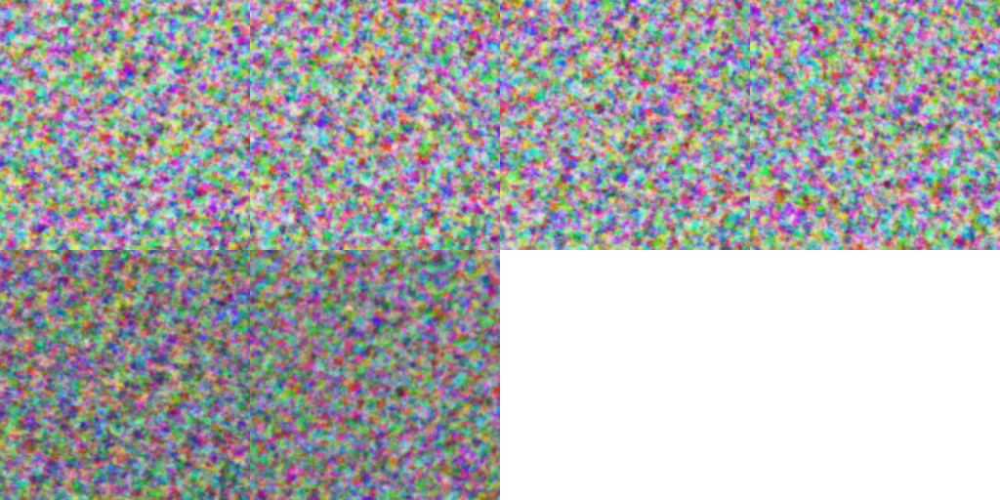

Status: : ETR=3:05:01.738497	ETA=3:08:48.304589	T=0:03:46.566092	Progress: 200/10000

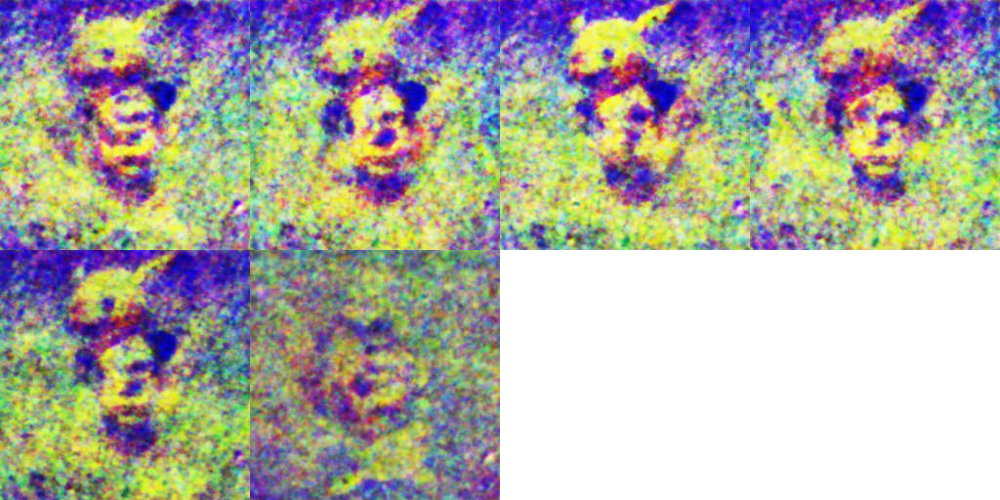

Status: : ETR=3:04:28.206602	ETA=3:12:09.381877	T=0:07:41.175275	Progress: 400/10000

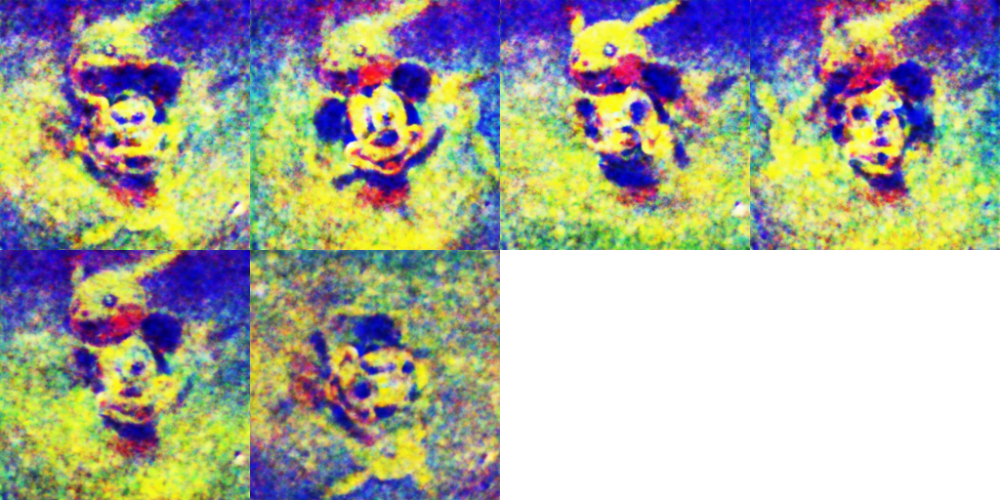

Status: : ETR=3:01:53.332279	ETA=3:13:29.927956	T=0:11:36.595677	Progress: 600/10000

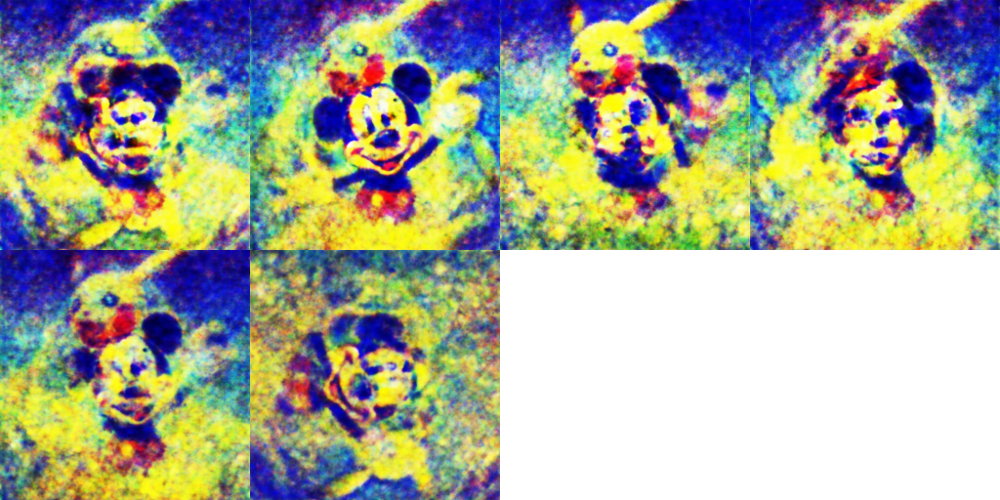

Status: : ETR=2:58:38.962870	ETA=3:14:11.046598	T=0:15:32.083728	Progress: 800/10000

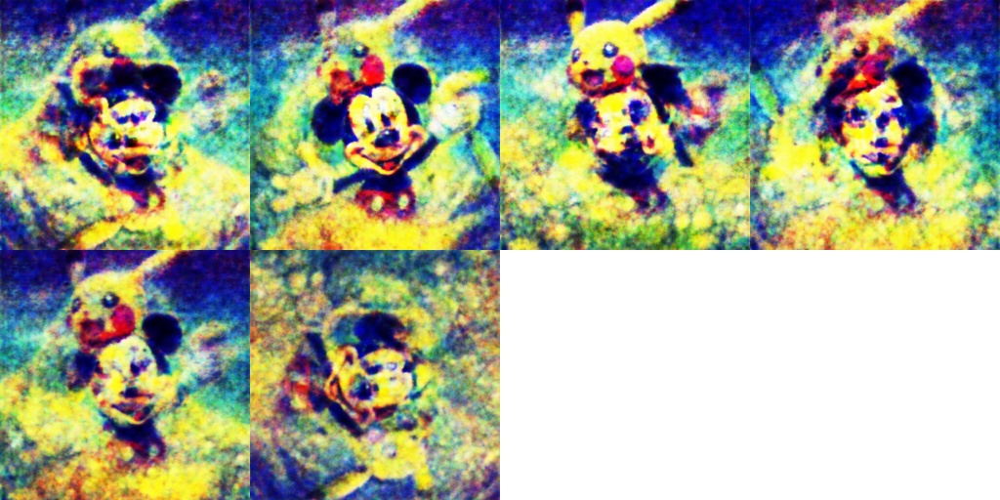

Status: : ETR=2:55:08.461681	ETA=3:14:36.068535	T=0:19:27.606853	Progress: 1000/10000

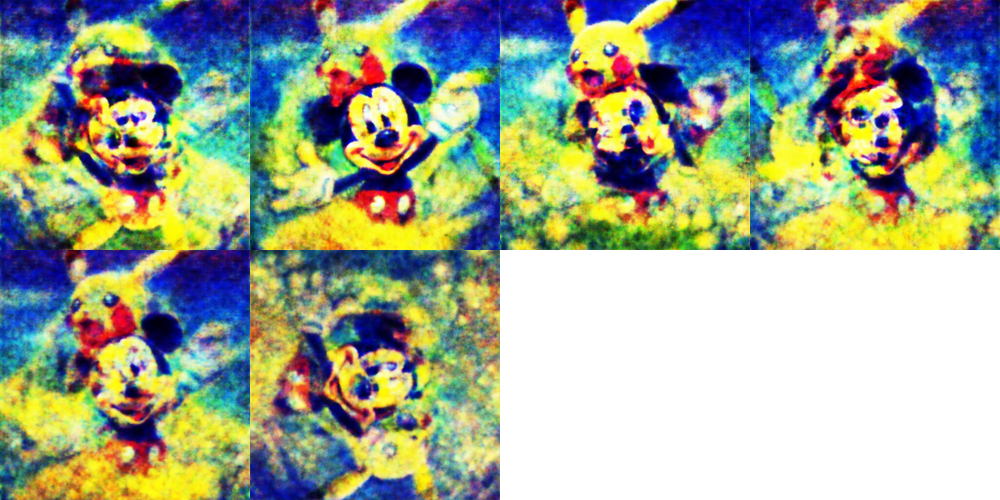

Status: : ETR=2:51:29.533186	ETA=3:14:52.651347	T=0:23:23.118162	Progress: 1200/10000

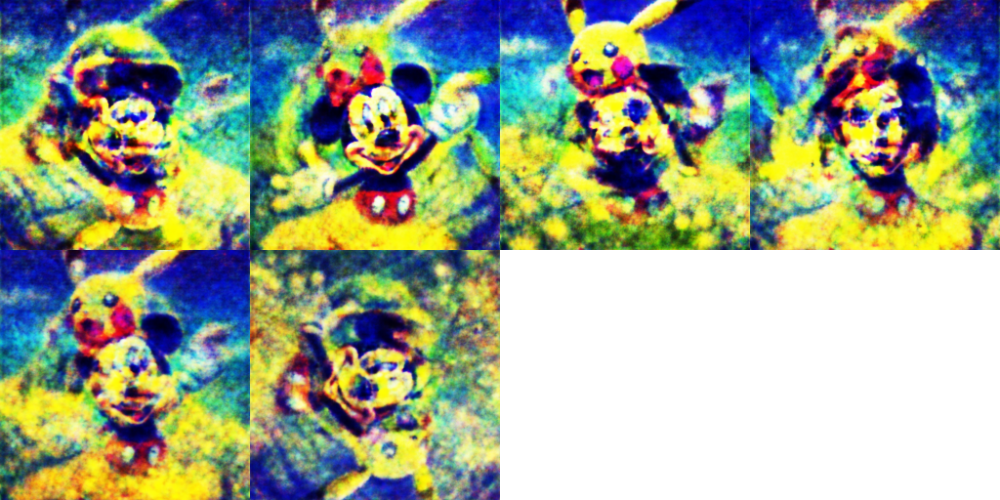

Status: : ETR=2:50:49.830018	ETA=3:14:58.048411	T=0:24:08.218393	Progress: 1238/10000
Interrupted early at iteration 1238


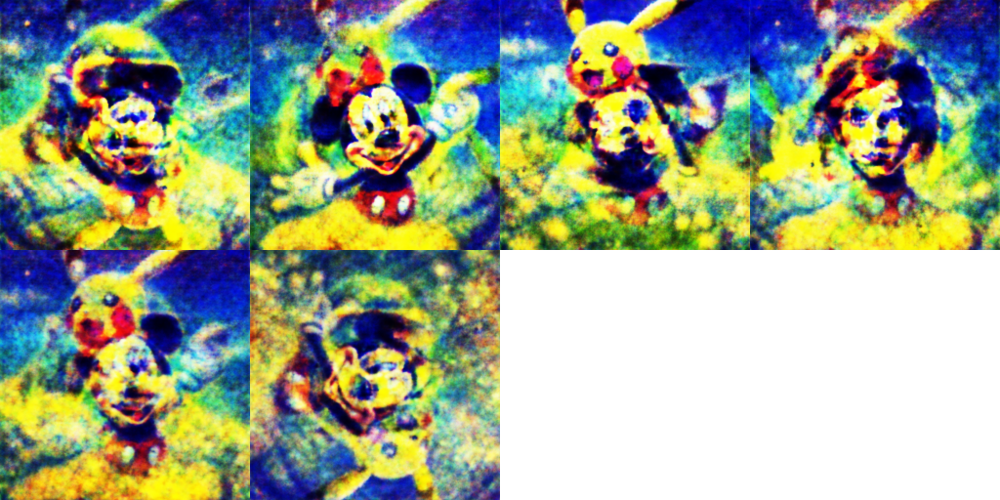

In [22]:
NUM_ITER=10000

#Set the minimum and maximum noise timesteps for the dream loss (aka score distillation loss)
s.max_step=MAX_STEP=990
s.min_step=MIN_STEP=10

display_eta=rp.eta(NUM_ITER, title='Status: ')

DISPLAY_INTERVAL = 200

print('Every %i iterations we display an image in the form [[image_w, image_x, image_y, image_z], [bottom_image, top_image]] where'%DISPLAY_INTERVAL)
print('    image_w = bottom_image * top_image')
print('    image_x = bottom_image * top_image.rot90()')
print('    image_y = bottom_image * top_image.rot180()')
print('    image_z = bottom_image * top_image.rot270()')
print()
print('Interrupt the kernel at any time to return the currently displayed image')
print('You can run this cell again to resume training later on')
print()
print('Please expect this to take hours to get good images (especially on the slower Colab GPU\'s! The longer you wait the better they\'ll be')

try:
    for iter_num in range(NUM_ITER):
        display_eta(iter_num) #Print the remaining time

        preds=[]
        for label,learnable_image,weight in rp.random_batch(list(zip(labels,learnable_images,weights)), batch_size=1):
            pred=s.train_step(
                label.embedding,
                learnable_image()[None],

                #PRESETS (uncomment one):
                noise_coef=.1*weight,guidance_scale=60,#10
                # noise_coef=0,image_coef=-.01,guidance_scale=50,
                # noise_coef=0,image_coef=-.005,guidance_scale=50,
                # noise_coef=.1,image_coef=-.010,guidance_scale=50,
                # noise_coef=.1,image_coef=-.005,guidance_scale=50,
                # noise_coef=.1*weight, image_coef=-.005*weight, guidance_scale=50,
            )
            preds+=list(pred)

        with torch.no_grad():
            if iter_num and not iter_num%(DISPLAY_INTERVAL*50):
                #Wipe the slate every 50 displays so they don't get cut off
                from IPython.display import clear_output
                clear_output()

            if not iter_num%DISPLAY_INTERVAL:
                im = get_display_image()
                ims.append(im)
                rp.display_image(im)

        optim.step()
        optim.zero_grad()
except KeyboardInterrupt:
    print()
    print('Interrupted early at iteration %i'%iter_num)
    im = get_display_image()
    ims.append(im)
    rp.display_image(im)